| band_id| Band   | Usage                 | A Center| A Width | B Center| B_width | res|
| --:      | :--    | :--                 |--:      | --:     | --:     | --:     | --:|
| 1        | Band 1 | Coastal aerosol	  |  442.7	 |  21	   |  442.2  |	 21	   | 60 |
| 2        | Band 2 | Blue	              |  492.4	 |  66	   |  492.1  |	 66	   | 10 |
| 3        | Band 3 | Green	              |  559.8	 |  36	   |  559.0  |	 36	   | 10 |
| 4        | Band 4 | Red	              |  664.6	 |  31	   |  664.9  |	 31	   | 10 |
| 5        | Band 5 | Vegetation red edge |  704.1	 |  15	   |  703.8  |	 16	   | 20 |
| 6        | Band 6 | Vegetation red edge |  740.5	 |  15	   |  739.1  |	 15	   | 20 |
| 7        | Band 7 | Vegetation red edge |  782.8	 |  20	   |  779.7  |	 20	   | 20 |
| 8        | Band 8 | NIR	              |  832.8	 | 106     |  832.9  |	106	   | 10 |
| 9        | Band 8A| Narrow NIR          |  864.7	 |  21	   |  864.0  |	 22	   | 20 |
| 10       | Band 9 | Water vapour	      |  945.1	 |  20	   |  943.2  |	 21	   | 60 |
| 11       | Band 10| SWIR – Cirrus	      | 1373.5	 |  31	   | 1376.9  |	 30	   | 60 |
| 12       | Band 11| SWIR                | 1613.7	 |  91	   | 1610.4  |	 94	   | 20 |
| 13       | Band 12| SWIR                | 2202.4	 | 175     | 2185.7  |	185	   | 20 |

In [1]:
import xarray
import zarr
import pandas
import matplotlib.pyplot as plt
import geopandas
import numpy

In [2]:
from dask.distributed import LocalCluster
import dask.distributed
import logging

dask.config.set({'temporary-directory': '/tablespace/dask'})
dask.config.set({'distributed.comm.timeouts.tcp': '1200s'})
dask.config.set({'distributed.comm.timeouts.connect': '1200s'})
dask.config.get('distributed.comm.timeouts')

cluster = dask.distributed.LocalCluster(n_workers=10,# Wed probably be better with less workers. Totally i/o bound
                                        threads_per_worker=2, 
                                        memory_limit='20GB', 
                                        processes=True, 
                                        dashboard_address='localhost:8787',
                                        silence_logs=logging.ERROR)

client = dask.distributed.Client(cluster) 

In [3]:
tiles = ['11SLB', # UCSB
         '10SFH', # LNBL 1
         '10SGH', # LNBL 2         
         '11SQD', # DRI 1
         '11SQC', # DRI 2
         '11TNK', # BSU 1
         '11TNJ', # BSU 2
         '11TPK', # BSU 3
         '11TPJ'  # BSU 5
        ]
tiles = ['UCSB', 'DRI', 'LBNL' , 'BSU']
tile = tiles[0]
tile

'UCSB'

In [28]:
zarr_store = f'/tablespace/sentinel2/{tile}_sharpend.zarr'
ds = xarray.open_zarr(zarr_store)

In [29]:
ds

<xarray.Dataset> Size: 12GB
Dimensions:               (time: 135, y: 921, x: 1347, band: 10, detector: 7,
                           y_angles: 23, x_angles: 23)
Coordinates:
  * band                  (band) <U3 120B 'B5' 'B6' 'B7' ... 'B3' 'B4' 'B8'
  * detector              (detector) <U2 56B '10' '7' '9' '12' '8' '6' '11'
  * time                  (time) datetime64[ns] 1kB 2022-03-02T18:43:11.02400...
  * x                     (x) float64 11kB 3.146e+05 3.146e+05 ... 3.28e+05
  * x_angles              (x_angles) float64 184B 3e+05 3.05e+05 ... 4.1e+05
  * y                     (y) float64 7kB 4.171e+06 4.171e+06 ... 4.162e+06
  * y_angles              (y_angles) float64 184B 4.2e+06 4.195e+06 ... 4.09e+06
Data variables:
    AOT                   (time, y, x) float32 670MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    CLD                   (time, y, x) float64 1GB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    SCL                   (time, y, x) float64 1GB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    SNW                   (time, y, x) float64 1GB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    WVP                   (time, y, x) float32 670MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    reflectance           (time, y, x, band) float32 7GB dask.array<chunksize=(1, 500, 500, 10), meta=np.ndarray>
    spatial_ref           int64 8B ...
    sun_azimuth_grid      (time, y_angles, x_angles) float32 286kB dask.array<chunksize=(1, 23, 23), meta=np.ndarray>
    sun_zenith_grid       (time, y_angles, x_angles) float32 286kB dask.array<chunksize=(1, 23, 23), meta=np.ndarray>
    viewing_azimuth_grid  (time, band, y_angles, x_angles, detector) float32 20MB dask.array<chunksize=(1, 10, 23, 23, 7), meta=np.ndarray>
    viewing_zenith_grid   (time, band, y_angles, x_angles, detector) float32 20MB dask.array<chunksize=(1, 10, 23, 23, 7), meta=np.ndarray>
Attributes: (12/84)
    AOT_QUANTIFICATION_VALUE:              1000.0
    AOT_QUANTIFICATION_VALUE_UNIT:         none
    AOT_RETRIEVAL_ACCURACY:                0.0
    AOT_RETRIEVAL_METHOD:                  CAMS
    BOA_QUANTIFICATION_VALUE:              10000
    BOA_QUANTIFICATION_VALUE_UNIT:         none
    ...                                    ...
    viewing_zenith_mean_B5:                5.57337094496921
    viewing_zenith_mean_B6:                5.61673664597282
    viewing_zenith_mean_B7:                5.66383856967182
    viewing_zenith_mean_B8:                5.44031658640393
    viewing_zenith_mean_B8A:               5.71403297081585
    viewing_zenith_mean_B9:                5.82625326117014

# Todo
- [x] pansharpening
- [x] Add band coordinates as strings
- [x] slice to UCSB site
- [x] Calculate NDVI + NSDI
- [x] find the time with the lowest NDSI for each
- [x] Read masks: 
    - cloud
    - snow
    - shadow
- [ ] R0 for summer only

# Subset

In [6]:
def normalize(data):
    data = data - numpy.nanmin(data)
    data = data / numpy.nanmax(data)     
    return data

def mask_nans(data):
    data = numpy.ma.masked_array(data, numpy.isnan(data))
    data[data.mask] = 0
    return data
    
def plot(da, time=None, mask=True):
    fig, ax = plt.subplots(dpi=300)    
        
    if time is not None:
        da = da.sel(time=time)

    rgb = da.squeeze()
                
    if 'band' in da.coords:
        rgb = rgb.transpose('y', 'x', 'band')
    else:
        rgb = rgb.transpose('y', 'x') 
    
    rgb =rgb.values

    if mask:
        rgb = mask_nans(rgb)
        
    img = ax.imshow(rgb)
    ax.axis('off')  
    ax.set_aspect('equal')
    cbar = fig.colorbar(img, ax=ax, shrink=0.7)    
    #return ax

In [7]:
# Only summer
ds = ds.sel(time=(ds['time.month'] >= 5) & (ds['time.month'] <= 11))
ds

<xarray.Dataset> Size: 7GB
Dimensions:               (time: 81, y: 921, x: 1347, band: 10, detector: 7,
                           y_angles: 23, x_angles: 23)
Coordinates:
  * band                  (band) <U3 120B 'B5' 'B6' 'B7' ... 'B3' 'B4' 'B8'
  * detector              (detector) <U2 56B '10' '7' '9' '12' '8' '6' '11'
  * time                  (time) datetime64[ns] 648B 2022-05-01T18:39:21.0240...
  * x                     (x) float64 11kB 3.146e+05 3.146e+05 ... 3.28e+05
  * x_angles              (x_angles) float64 184B 3e+05 3.05e+05 ... 4.1e+05
  * y                     (y) float64 7kB 4.171e+06 4.171e+06 ... 4.162e+06
  * y_angles              (y_angles) float64 184B 4.2e+06 4.195e+06 ... 4.09e+06
Data variables:
    AOT                   (time, y, x) float32 402MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    CLD                   (time, y, x) float64 804MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    SCL                   (time, y, x) float64 804MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    SNW                   (time, y, x) float64 804MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    WVP                   (time, y, x) float32 402MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    reflectance           (time, y, x, band) float32 4GB dask.array<chunksize=(1, 500, 500, 10), meta=np.ndarray>
    spatial_ref           int64 8B ...
    sun_azimuth_grid      (time, y_angles, x_angles) float32 171kB dask.array<chunksize=(1, 23, 23), meta=np.ndarray>
    sun_zenith_grid       (time, y_angles, x_angles) float32 171kB dask.array<chunksize=(1, 23, 23), meta=np.ndarray>
    viewing_azimuth_grid  (time, band, y_angles, x_angles, detector) float32 12MB dask.array<chunksize=(1, 10, 23, 23, 7), meta=np.ndarray>
    viewing_zenith_grid   (time, band, y_angles, x_angles, detector) float32 12MB dask.array<chunksize=(1, 10, 23, 23, 7), meta=np.ndarray>
Attributes: (12/84)
    AOT_QUANTIFICATION_VALUE:              1000.0
    AOT_QUANTIFICATION_VALUE_UNIT:         none
    AOT_RETRIEVAL_ACCURACY:                0.0
    AOT_RETRIEVAL_METHOD:                  CAMS
    BOA_QUANTIFICATION_VALUE:              10000
    BOA_QUANTIFICATION_VALUE_UNIT:         none
    ...                                    ...
    viewing_zenith_mean_B5:                5.57337094496921
    viewing_zenith_mean_B6:                5.61673664597282
    viewing_zenith_mean_B7:                5.66383856967182
    viewing_zenith_mean_B8:                5.44031658640393
    viewing_zenith_mean_B8A:               5.71403297081585
    viewing_zenith_mean_B9:                5.82625326117014

# Calc NDSI and NDVI
NDSI = (B3-B11)/(B3+B11)

In [8]:
reflectance = ds['reflectance']
# Make sure we don't have 0 in denominator; can happen due to negative reflectances

b8_b4 = (reflectance.sel(band='B8') + reflectance.sel(band='B4'))
b8_b4 = b8_b4.where(b8_b4!=0)
ndvi = (reflectance.sel(band='B8') - reflectance.sel(band='B4')) / b8_b4

b3_b11 = (reflectance.sel(band='B3') + reflectance.sel(band='B11'))
b3_b11 = b3_b11.where(b3_b11!=0)
ndsi = (reflectance.sel(band='B3') - reflectance.sel(band='B11')) / b3_b11

ndsi = ndsi.where(ndsi<1).where(ndsi>-1)
ndvi = ndvi.where(ndvi<1).where(ndvi>-1)

ds['ndvi'] = ndvi
ds['ndsi'] = ndsi

In [9]:
ds = ds.sortby('y', ascending=False).sortby('y_angles', ascending=False)

In [10]:
ds

<xarray.Dataset> Size: 8GB
Dimensions:               (time: 81, y: 921, x: 1347, band: 10, detector: 7,
                           y_angles: 23, x_angles: 23)
Coordinates:
  * band                  (band) <U3 120B 'B5' 'B6' 'B7' ... 'B3' 'B4' 'B8'
  * detector              (detector) <U2 56B '10' '7' '9' '12' '8' '6' '11'
  * time                  (time) datetime64[ns] 648B 2022-05-01T18:39:21.0240...
  * x                     (x) float64 11kB 3.146e+05 3.146e+05 ... 3.28e+05
  * x_angles              (x_angles) float64 184B 3e+05 3.05e+05 ... 4.1e+05
  * y                     (y) float64 7kB 4.171e+06 4.171e+06 ... 4.162e+06
  * y_angles              (y_angles) float64 184B 4.2e+06 4.195e+06 ... 4.09e+06
Data variables: (12/13)
    AOT                   (time, y, x) float32 402MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    CLD                   (time, y, x) float64 804MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    SCL                   (time, y, x) float64 804MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    SNW                   (time, y, x) float64 804MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    WVP                   (time, y, x) float32 402MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    reflectance           (time, y, x, band) float32 4GB dask.array<chunksize=(1, 500, 500, 10), meta=np.ndarray>
    ...                    ...
    sun_azimuth_grid      (time, y_angles, x_angles) float32 171kB dask.array<chunksize=(1, 23, 23), meta=np.ndarray>
    sun_zenith_grid       (time, y_angles, x_angles) float32 171kB dask.array<chunksize=(1, 23, 23), meta=np.ndarray>
    viewing_azimuth_grid  (time, band, y_angles, x_angles, detector) float32 12MB dask.array<chunksize=(1, 10, 23, 23, 7), meta=np.ndarray>
    viewing_zenith_grid   (time, band, y_angles, x_angles, detector) float32 12MB dask.array<chunksize=(1, 10, 23, 23, 7), meta=np.ndarray>
    ndvi                  (time, y, x) float32 402MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
    ndsi                  (time, y, x) float32 402MB dask.array<chunksize=(1, 500, 500), meta=np.ndarray>
Attributes: (12/84)
    AOT_QUANTIFICATION_VALUE:              1000.0
    AOT_QUANTIFICATION_VALUE_UNIT:         none
    AOT_RETRIEVAL_ACCURACY:                0.0
    AOT_RETRIEVAL_METHOD:                  CAMS
    BOA_QUANTIFICATION_VALUE:              10000
    BOA_QUANTIFICATION_VALUE_UNIT:         none
    ...                                    ...
    viewing_zenith_mean_B5:                5.57337094496921
    viewing_zenith_mean_B6:                5.61673664597282
    viewing_zenith_mean_B7:                5.66383856967182
    viewing_zenith_mean_B8:                5.44031658640393
    viewing_zenith_mean_B8A:               5.71403297081585
    viewing_zenith_mean_B9:                5.82625326117014

# Plot a random date

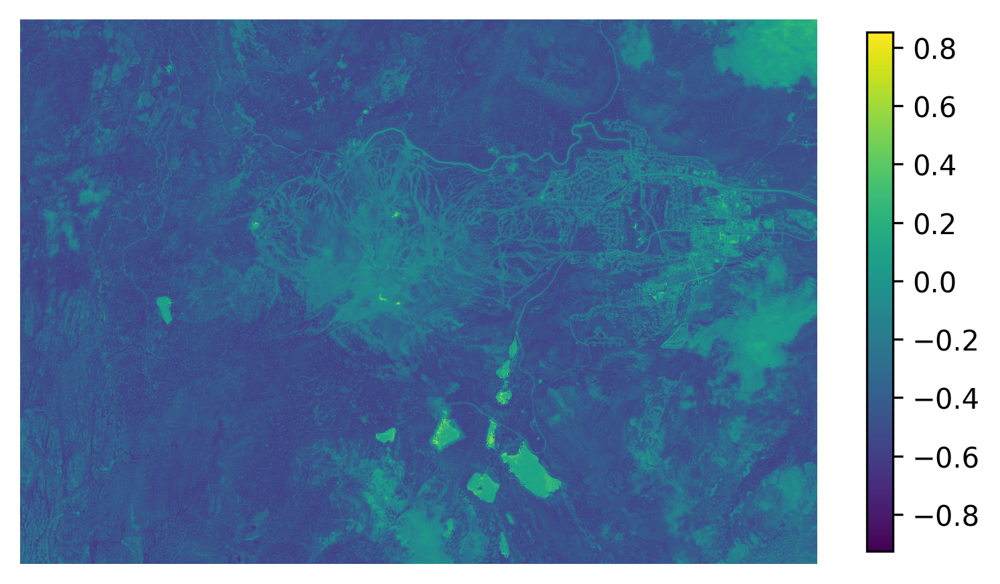

In [11]:
date = ds.time[28]
plot(ds['ndsi'], time=date)

# R0 
## For locations where there exists an observation with NDSI < 0:

1. From those locations, remove all locations which:
    - Have shadow
    - Have snowmask
2. Then, find the observation with the highest NDVI

## For locations where there does not exist an observation with NDSI < 0:
1. Take observations whose blue reflectances is closest, but not smaller than 0.1

In [12]:
all_nans_mask = ds['ndsi'].isnull().all(dim='time')
all_nans_mask = all_nans_mask.compute()
all_nans_mask.where(all_nans_mask, drop=True).coords

Coordinates:
  * x        (x) float64 0B 
  * y        (y) float64 0B 

In [13]:
# we can get nan NDSI
ds['ndsi'] = ds['ndsi'].fillna(1)

CPU times: user 2.94 s, sys: 302 ms, total: 3.24 s
Wall time: 3.6 s


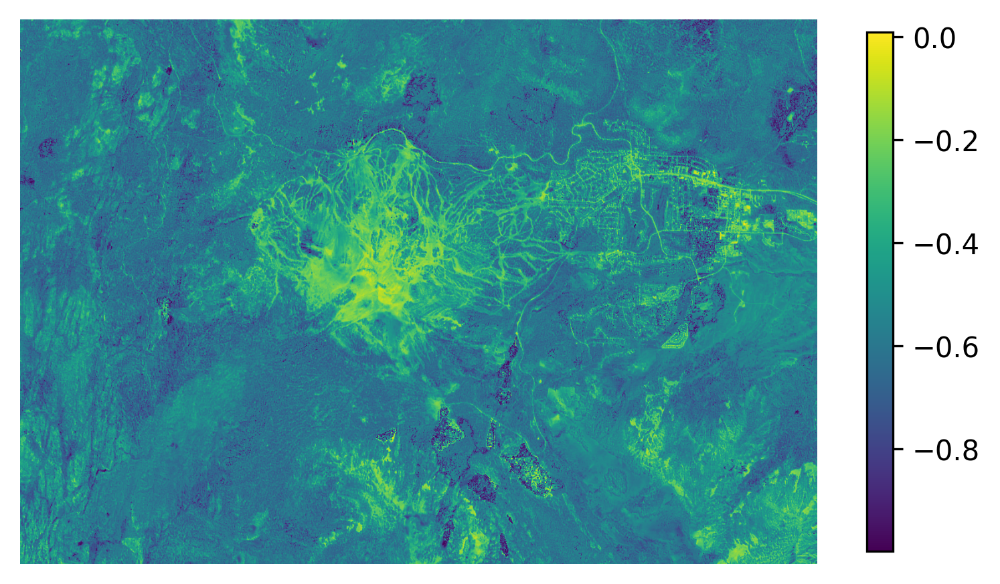

In [14]:
%%time
# this requires each chunk to be read
min_ndsi = ds['ndsi'].min(dim='time')
min_ndsi = min_ndsi.compute() # We can compute; this is only one timeslice and 1 band
plot(min_ndsi)

## SCL keys
| Value | meaning  |
| --:   | :--      |
| 0     | NO_DATA  |
| 1     | SATURATED_OR_DEFECTIVE|
| 2     | CAST_SHADOWS|
| 3     | CLOUD_SHADOWS|
| 4     | VEGETATION|
| 5     | NOT_VEGETATED|
| 6     | WATER|
| 7     | UNCLASSIFIED|
| 8     | CLOUD_MEDIUM_PROBABILITY|
| 9     | CLOUD_HIGH_PROBABILITY|
| 10    | THIN_CIRRUS|
| 11    | SNOW|

We are probably OK with 
- 4: VEGETATION
- 5: NOT_VEGETATED
- 6: WATER
- 7: UNCLASSIFIED

In [15]:
# 1. Discard all locations that never have a NDSI below 1
candidates = ds.drop_vars(['sun_zenith_grid', 'sun_azimuth_grid', 'viewing_zenith_grid', 'viewing_azimuth_grid' ]).drop_dims(['x_angles', 'y_angles'])
#candidates = ds

ndsi_mask = min_ndsi < 0
candidates = candidates.where(ndsi_mask) 

# 2. Discard all observations when the cloud or snow probablility wasn't 0
candidates = candidates.where(candidates['CLD']==0)
candidates = candidates.where(candidates['SNW']==0)

# 3. Keep only observations that were veg, nonveg, or unclassified
mask_scl = ((candidates['SCL']==4) | (candidates['SCL']==5)  | (candidates['SCL']==7))
candidates = candidates.where(mask_scl)

# 4. Keep only observations where MODIS band 3 (450 nm, +-blue, Sentinel band 2) is larger than 10%
#candidates = candidates.where(candidates['reflectance'].sel(band='B2') > 0.1)

# 5. Keep only observations with negative NDSI
#candidates = candidates.where(candidates['ndsi']<0)

# 6. Keep only observations with more green than blue
candidates = candidates.where(candidates['reflectance'].sel(band='B2') < candidates['reflectance'].sel(band='B3'))

# 7. For all left observations, find for every location the observation with max NDVI
candidates_max_ndvi = candidates['ndvi'].max(dim=('time'))

## Get R0 - via index

In [16]:
# Replace all nans in NDVI
#masked_ndvi = candidates['ndvi'].where(numpy.isnan(candidates['ndvi']), -2)
masked_ndvi = candidates['ndvi'].fillna(-1)

In [17]:
%%time
# Find the time indices whith the lowest NDVI
r0_idx = masked_ndvi.argmax(dim='time', skipna=True).compute()

CPU times: user 9.76 s, sys: 1.05 s, total: 10.8 s
Wall time: 12.1 s


In [18]:
%%time
# It seems like this is single-core and runs out of mem for lage regions

#r0 = ds.isel(time=r0_idx, drop=True)
#r0 = ds[['reflectance']].isel(time=r0_idx, drop=True)
#r0 = candidates.isel(time=r0_idx, drop=True)
r0 = candidates[['reflectance']].isel(time=r0_idx, drop=True)

#ds_no_angles = ds.drop_vars(['sun_zenith_grid', 'sun_azimuth_grid', 'viewing_zenith_grid', 'viewing_azimuth_grid' ]).drop_dims(['x_angles', 'y_angles'])
#r0 = ds_no_angles.isel(time=r0_idx, drop=True)

CPU times: user 4.51 s, sys: 416 ms, total: 4.92 s
Wall time: 4.78 s


In [19]:
#r0 = r0.transpose('time', 'y', 'x', 'y_angles', 'x_angles', 'band', 'detector')
r0 = r0.transpose('y', 'x', 'band')

In [20]:
%%time
r0 = r0.compute()

/home/griessbaum/.conda/envs/spires2/lib/python3.12/site-packages/distributed/client.py:3161: UserWarning: Sending large graph of size 16.99 MiB.
This may cause some slowdown.
Consider scattering data ahead of time and using futures.
  warnings.warn(


CPU times: user 9.39 s, sys: 939 ms, total: 10.3 s
Wall time: 12.3 s


In [ ]:
r0 = r0.chunk(x=500, y=500)

In [ ]:
r0

In [ ]:
%%time
zarr_store = f'/tablespace/sentinel2/{tile}_r0.zarr'

r0.to_zarr(zarr_store, mode='w')

# Some plots

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/home/griessbaum/.conda/envs/spires2/lib/python3.12/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


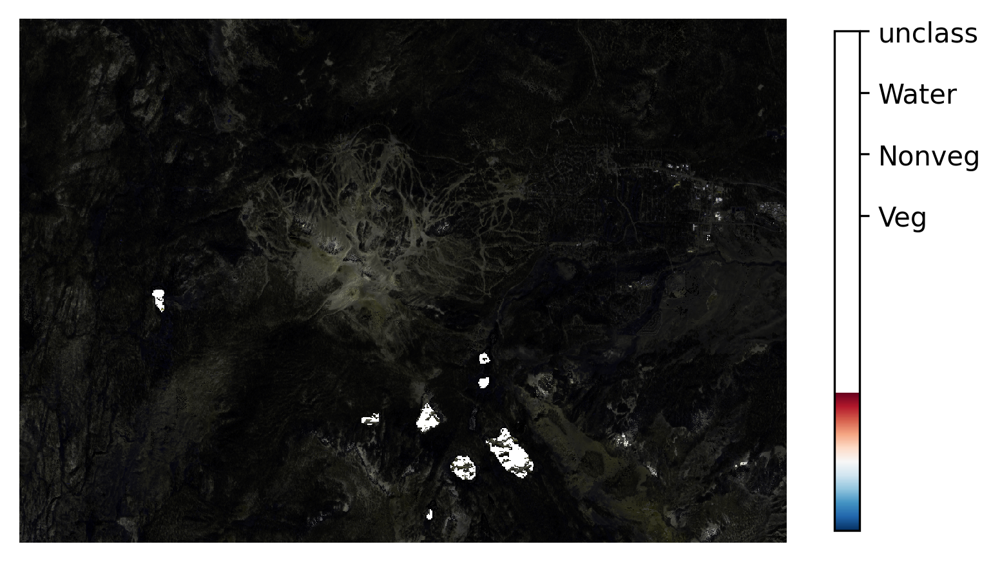

In [21]:
from matplotlib.colors import ListedColormap

fig, ax = plt.subplots(dpi=300)

categories = ['Veg', 'Nonveg', 'Water', 'unclass']
colors = ['blue', 'green', 'red', 'purple']  # Example colors, you can adjust as needed
cmap = ListedColormap(colors)

#img = ax.imshow(r0['SCL'].astype(int), cmap=cmap, vmin=4, vmax=7)
img = r0['reflectance'].sel(band=['B4', 'B4', 'B3']).plot.imshow(ax=ax)
#cbar = fig.colorbar(img, ax=ax, ticks=numpy.arange(len(categories)), shrink=0.7)

cbar = fig.colorbar(img, ax=ax, shrink=0.7)    
cbar.ax.set_yticks([4,5,6,7])
cbar.ax.set_yticklabels(categories)

ax.axis('off')  
ax.set_aspect('equal')

# To geotiff

In [22]:
r0.rio.write_crs(32611, inplace=True)
r0.rio.set_spatial_dims('x', 'y', inplace=True)
tiff = r0['reflectance'].to_dataset('band')

#tiff[['ndsi', 'ndvi']] = r0[['ndsi', 'ndvi']]
tiff = tiff.fillna(-1)
tiff.rio.to_raster('r0.tiff')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


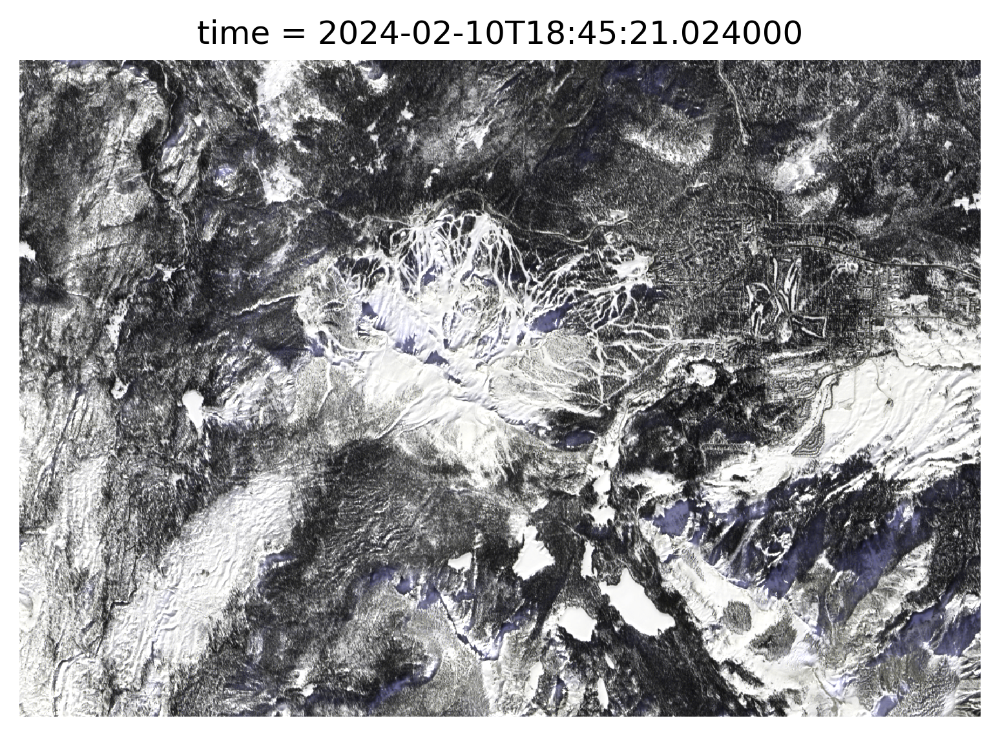

In [55]:
timeslice = ds.sel(time='2024-02-10').squeeze()

fig, ax = plt.subplots(dpi=300)

img = timeslice['reflectance'].sel(band=['B4', 'B4', 'B3']).plot.imshow(ax=ax)

ax.axis('off')  
ax.set_aspect('equal')

In [57]:
#ds['sun_zenith_grid'] = ds['sun_zenith_grid'].interp(y_angles=ds.y, x_angles=ds.x, method='nearest').squeeze()

tiff = timeslice['reflectance'].to_dataset('band')
tiff['sun_zenith'] = timeslice['sun_zenith_grid']
tiff = tiff.fillna(-1)
tiff.rio.write_crs(32611, inplace=True)
tiff.rio.set_spatial_dims('x', 'y', inplace=True)
tiff.rio.to_raster('r_2024-02-10.tiff')

In [ ]:
client.close()
cluster.close()